# Audio Data Cleaning

- Remove long samples
- Remove mislabelled samples
- Remove speech / lower frequencies

# Audio Processing + Feature Extraction
### Frequency domain
- Fundamental frequencies (list of floats)
    - Mean
    - Max
- Biphonation (t/f) : i.e. fundamental frequencies don't have a single Greatest Common Factor (2 stacks of harmonic multiples)

### Time Domain
- Amplitude modulation / wideband spectra
- Duration of notes
- Number of syllables in call
- Intervals between syllables

In [1]:
import json

import IPython.display
import librosa.feature
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from scipy import signal

plt.rcParams["figure.figsize"] = [20, 10]
plt.rcParams["figure.dpi"] = 100

ModuleNotFoundError: No module named 'librosa'

In [ ]:
def Audio(audio: np.ndarray, sr: int):
    """
    Use instead of IPython.display.Audio as a workaround for VS Code.
    `audio` is an array with shape (channels, samples) or just (samples,) for mono.
    """

    if np.ndim(audio) == 1:
        channels = [audio.tolist()]
    else:
        channels = audio.tolist()

    return IPython.display.HTML(
        f"""
        <script>
            if (!window.audioContext) {{
                window.audioContext = new AudioContext();
                window.playAudio = function(audioChannels, sr) {{
                    const buffer = audioContext.createBuffer(audioChannels.length, audioChannels[0].length, sr);
                    for (let [channel, data] of audioChannels.entries()) {{
                        buffer.copyToChannel(Float32Array.from(data), channel);
                    }}

                    const source = audioContext.createBufferSource();
                    source.buffer = buffer;
                    source.connect(audioContext.destination);
                    source.start();
                }}
            }}
        </script>
        <button onclick="playAudio({json.dumps(channels)}, {sr})">Play</button>
        """
    )

In [7]:
# load filtered filenames for audio and sono
f = open("../data/raw/filter_ids.json")
ids = json.load(f)
audio_files = []
sono_files = []
for my_id in ids:
    audio_files.append("../data/raw/recordings/" + str(my_id) + ".mp3")
    sono_files.append("../data/raw/sonograms/" + str(my_id) + ".png")

In [40]:
# plot sonograms as a grid, given an array of filenames
def plot_sono_grid(filenames, rows, cols):
    fig, ax = plt.subplots(nrows=rows, ncols=cols)
    for i in range(rows):
        for j in range(cols):
            img_f = filenames[i * cols + j]
            ax[i, j].set_axis_off()
            # ax[i,j].title.set_text("")
            ax[i, j].set_title(img_f[22:-4])  # set the title as the id
            ax[i, j].imshow(Image.open(img_f))

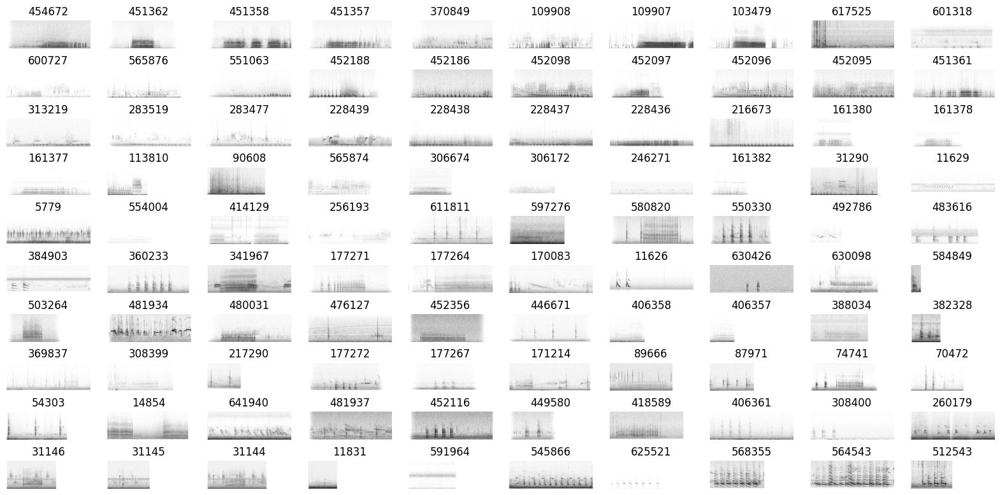

In [41]:
# plot sonograms to find recordings with background noise
plot_sono_grid(sono_files[100:], 10, 10)

In [48]:
# load a file with some low-frequency noise
# audio,audio_sr = librosa.load(filenames[123])
# audio,audio_sr = librosa.load("../data/raw/recordings/452116.mp3")
audio, audio_sr = librosa.load("../data/raw/recordings/597276.mp3")

In [49]:
Audio(audio, audio_sr)

In [58]:
# apply FIR filter
firwin_coeff = signal.firwin(101, cutoff=1000, fs=audio_sr, pass_zero=False)
firwin_audio = signal.lfilter(firwin_coeff, [1.0], audio)

In [83]:
# apply Butter filter
butter_coeff_b, butter_coeff_a = signal.butter(
    3, 1000, btype="highpass", fs=audio_sr
)  # numerator and denominator
butter_audio = signal.lfilter(butter_coeff_b, butter_coeff_a, audio)

In [59]:
# Audio(firwin, audio_sr)

In [84]:
Audio(butter_audio, audio_sr)

In [ ]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

In [ ]:
def amplitude_envelope(signal, frame_size, hop_length=0):
    if hop_length == 0:
        hop_length = frame_size
    amp_envelope = [
        signal[i : i + frame_size].max() for i in range(0, len(signal), hop_length)
    ]
    return np.array(amp_envelope)

# Visualizing Audio Features
